In [1]:
import pandas as pd
import numpy as np

In [2]:
import os

os.listdir("./")

['.ipynb_checkpoints',
 'data.npy',
 'DataSet2BOW2Classes.ipynb',
 'DataSet2ChracterNgrams2ClassesV2.ipynb',
 'gab.csv',
 'gab_data_cleaned.csv',
 'lexicons.csv',
 'Spam Classification using BERT Embeddings+TermProximityDataset2.ipynb']

In [20]:
df_exp1 = pd.read_csv('processed_gab.csv')

In [22]:
df_exp1.drop(columns="Unnamed: 0" , inplace=True)

In [24]:
import seaborn as sns
import matplotlib as plt
%matplotlib inline 

In [25]:
df_exp1

,processed_text,class
0,joined gab remind retarded jew haters typing a...,1
1,left really scared,0
2,literally looks like monkey supposed pretend p...,0
3,dumb cunt,1
4,makes asshole,0
...,...,...
33771,fucking retard,1
33772,twitter banned reported fbi stating obvious or...,0
33773,routinely suspended saying fuck banned calling...,1
33774,got dropping cunt bomb lot,1


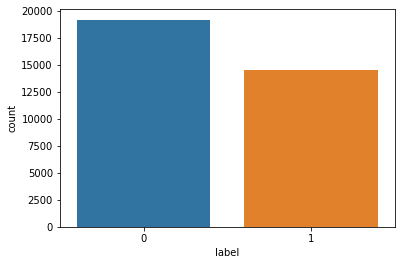

In [27]:
sns.countplot(df_exp1["label"])

In [26]:
df_exp1.columns = [ "message" , "label"]

In [28]:
data = df_exp1[['label', 'message']]

In [29]:
data['message']= data['message'].apply(lambda x : str (x))

In [30]:
data['message']

0        joined gab remind retarded jew haters typing a...
1                                       left really scared
2        literally looks like monkey supposed pretend p...
3                                                dumb cunt
4                                            makes asshole
                               ...                        
33771                                       fucking retard
33772    twitter banned reported fbi stating obvious or...
33773    routinely suspended saying fuck banned calling...
33774                           got dropping cunt bomb lot
33775    absolutely unbelievably fascinating pakistani ...
Name: message, Length: 33776, dtype: object

In [31]:
data


,label,message
0,1,joined gab remind retarded jew haters typing a...
1,0,left really scared
2,0,literally looks like monkey supposed pretend p...
3,1,dumb cunt
4,0,makes asshole
...,...,...
33771,1,fucking retard
33772,0,twitter banned reported fbi stating obvious or...
33773,1,routinely suspended saying fuck banned calling...
33774,1,got dropping cunt bomb lot


<hr>

## Generate BERT Embeddings

<hr>

<hr>

#### Installation command of BERT Server and client:

pip install -U bert-serving-server bert-serving-client

#### Command to start BERT server:

bert-serving-start -model_dir="Path to BERT Directory" -num_worker=1

<hr>

In [32]:
#bert-serving-start -model_dir=""C:/Users/hp/Desktop/ExperimentsDataSet1/6210BertExperiment/uncased_L-12_H-768_A-12/uncased_L-12_H-768_A-12"" -num_worker=1


#ExperimentsDataSet1/6210BertExperiment
from bert_serving.client import BertClient

bc = BertClient(check_version=False)

In [33]:
vectors_dict = dict()

terms = data["message"].unique()

vectors = bc.encode(list(terms))

for t, v in zip(terms, vectors):
    vectors_dict[t] = v

C:\Users\hp\Anaconda3\lib\site-packages\bert_serving\client\__init__.py:299: UserWarning: some of your sentences have more tokens than "max_seq_len=25" set on the server, as consequence you may get less-accurate or truncated embeddings.
here is what you can do:
- disable the length-check by create a new "BertClient(check_length=False)" when you do not want to display this warning
- or, start a new server with a larger "max_seq_len"
  '- or, start a new server with a larger "max_seq_len"' % self.length_limit)


In [48]:
vectors_dict

{'woman complain cleaning house amp man always take trash': array([ 1.24608494e-01,  5.46363890e-01,  4.76738900e-01, -2.70131111e-01,
         1.32288516e-01,  2.44151980e-01,  3.41550857e-01,  5.07267237e-01,
        -5.10238826e-01, -5.98167777e-02,  4.20782119e-01, -8.68205801e-02,
         1.04948491e-01,  3.09972644e-01, -1.47362506e+00,  2.68456936e-01,
         8.77629340e-01,  6.06996000e-01, -5.32524884e-01,  1.23107359e-01,
         3.29928041e-01, -1.78652480e-02,  9.87203643e-02, -4.06637013e-01,
         2.14605853e-01, -1.10860296e-01,  2.64848471e-01,  2.88361847e-01,
        -1.23665243e-01, -3.57226506e-02, -2.81717271e-01,  1.66056886e-01,
         2.46882096e-01, -4.14798379e-01, -1.17219776e-01, -3.26048344e-01,
        -5.63454442e-03,  6.45426393e-01, -2.91239321e-01,  7.49189794e-01,
         2.29892865e-01, -6.07859075e-01,  2.03582987e-01, -9.86465886e-02,
         1.94512531e-02,  4.07587141e-01,  5.33275664e-01, -3.20885219e-02,
        -2.91655183e-01, -2.3

In [62]:
import pickle
data.to_pickle("dataEMbwithProximity")

In [34]:
data["embeddings"] = data["message"].map(vectors_dict)
data.head()

,label,message,embeddings
0,1,joined gab remind retarded jew haters typing a...,"[0.127634, 0.15833358, 0.101371296, -0.2872873..."
1,0,left really scared,"[-0.023830246, -0.40528256, 0.3770728, 0.04245..."
2,0,literally looks like monkey supposed pretend p...,"[-0.30041745, 0.1357541, 0.645589, -0.22441724..."
3,1,dumb cunt,"[0.24376094, 0.22448578, 0.21197566, 0.2412964..."
4,0,makes asshole,"[0.033758305, 0.1607497, -0.21459483, 0.044851..."


In [45]:
len(res)

33776

In [42]:
import pickle
with open("VecRes.txt", "rb") as fp:   
    res = pickle.load(fp)



In [50]:
l = list (data["embeddings"] )

In [32]:
l2 = data["embeddings"] 

In [51]:
for i in range(0,33776):
    l[i] = np.append(l[i],res[i])
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

4212
4213
4214
4215
4216
4217
4218
4219
4220
4221
4222
4223
4224
4225
4226
4227
4228
4229
4230
4231
4232
4233
4234
4235
4236
4237
4238
4239
4240
4241
4242
4243
4244
4245
4246
4247
4248
4249
4250
4251
4252
4253
4254
4255
4256
4257
4258
4259
4260
4261
4262
4263
4264
4265
4266
4267
4268
4269
4270
4271
4272
4273
4274
4275
4276
4277
4278
4279
4280
4281
4282
4283
4284
4285
4286
4287
4288
4289
4290
4291
4292
4293
4294
4295
4296
4297
4298
4299
4300
4301
4302
4303
4304
4305
4306
4307
4308
4309
4310
4311
4312
4313
4314
4315
4316
4317
4318
4319
4320
4321
4322
4323
4324
4325
4326
4327
4328
4329
4330
4331
4332
4333
4334
4335
4336
4337
4338
4339
4340
4341
4342
4343
4344
4345
4346
4347
4348
4349
4350
4351
4352
4353
4354
4355
4356
4357
4358
4359
4360
4361
4362
4363
4364
4365
4366
4367
4368
4369
4370
4371
4372
4373
4374
4375
4376
4377
4378
4379
4380
4381
4382
4383
4384
4385
4386
4387
4388
4389
4390
4391
4392
4393
4394
4395
4396
4397
4398
4399
4400
4401
4402
4403
4404
4405
4406
4407
4408
4409
4410
4411


6516
6517
6518
6519
6520
6521
6522
6523
6524
6525
6526
6527
6528
6529
6530
6531
6532
6533
6534
6535
6536
6537
6538
6539
6540
6541
6542
6543
6544
6545
6546
6547
6548
6549
6550
6551
6552
6553
6554
6555
6556
6557
6558
6559
6560
6561
6562
6563
6564
6565
6566
6567
6568
6569
6570
6571
6572
6573
6574
6575
6576
6577
6578
6579
6580
6581
6582
6583
6584
6585
6586
6587
6588
6589
6590
6591
6592
6593
6594
6595
6596
6597
6598
6599
6600
6601
6602
6603
6604
6605
6606
6607
6608
6609
6610
6611
6612
6613
6614
6615
6616
6617
6618
6619
6620
6621
6622
6623
6624
6625
6626
6627
6628
6629
6630
6631
6632
6633
6634
6635
6636
6637
6638
6639
6640
6641
6642
6643
6644
6645
6646
6647
6648
6649
6650
6651
6652
6653
6654
6655
6656
6657
6658
6659
6660
6661
6662
6663
6664
6665
6666
6667
6668
6669
6670
6671
6672
6673
6674
6675
6676
6677
6678
6679
6680
6681
6682
6683
6684
6685
6686
6687
6688
6689
6690
6691
6692
6693
6694
6695
6696
6697
6698
6699
6700
6701
6702
6703
6704
6705
6706
6707
6708
6709
6710
6711
6712
6713
6714
6715


8902
8903
8904
8905
8906
8907
8908
8909
8910
8911
8912
8913
8914
8915
8916
8917
8918
8919
8920
8921
8922
8923
8924
8925
8926
8927
8928
8929
8930
8931
8932
8933
8934
8935
8936
8937
8938
8939
8940
8941
8942
8943
8944
8945
8946
8947
8948
8949
8950
8951
8952
8953
8954
8955
8956
8957
8958
8959
8960
8961
8962
8963
8964
8965
8966
8967
8968
8969
8970
8971
8972
8973
8974
8975
8976
8977
8978
8979
8980
8981
8982
8983
8984
8985
8986
8987
8988
8989
8990
8991
8992
8993
8994
8995
8996
8997
8998
8999
9000
9001
9002
9003
9004
9005
9006
9007
9008
9009
9010
9011
9012
9013
9014
9015
9016
9017
9018
9019
9020
9021
9022
9023
9024
9025
9026
9027
9028
9029
9030
9031
9032
9033
9034
9035
9036
9037
9038
9039
9040
9041
9042
9043
9044
9045
9046
9047
9048
9049
9050
9051
9052
9053
9054
9055
9056
9057
9058
9059
9060
9061
9062
9063
9064
9065
9066
9067
9068
9069
9070
9071
9072
9073
9074
9075
9076
9077
9078
9079
9080
9081
9082
9083
9084
9085
9086
9087
9088
9089
9090
9091
9092
9093
9094
9095
9096
9097
9098
9099
9100
9101


11327
11328
11329
11330
11331
11332
11333
11334
11335
11336
11337
11338
11339
11340
11341
11342
11343
11344
11345
11346
11347
11348
11349
11350
11351
11352
11353
11354
11355
11356
11357
11358
11359
11360
11361
11362
11363
11364
11365
11366
11367
11368
11369
11370
11371
11372
11373
11374
11375
11376
11377
11378
11379
11380
11381
11382
11383
11384
11385
11386
11387
11388
11389
11390
11391
11392
11393
11394
11395
11396
11397
11398
11399
11400
11401
11402
11403
11404
11405
11406
11407
11408
11409
11410
11411
11412
11413
11414
11415
11416
11417
11418
11419
11420
11421
11422
11423
11424
11425
11426
11427
11428
11429
11430
11431
11432
11433
11434
11435
11436
11437
11438
11439
11440
11441
11442
11443
11444
11445
11446
11447
11448
11449
11450
11451
11452
11453
11454
11455
11456
11457
11458
11459
11460
11461
11462
11463
11464
11465
11466
11467
11468
11469
11470
11471
11472
11473
11474
11475
11476
11477
11478
11479
11480
11481
11482
11483
11484
11485
11486
11487
11488
11489
11490
11491
11492
1149

13080
13081
13082
13083
13084
13085
13086
13087
13088
13089
13090
13091
13092
13093
13094
13095
13096
13097
13098
13099
13100
13101
13102
13103
13104
13105
13106
13107
13108
13109
13110
13111
13112
13113
13114
13115
13116
13117
13118
13119
13120
13121
13122
13123
13124
13125
13126
13127
13128
13129
13130
13131
13132
13133
13134
13135
13136
13137
13138
13139
13140
13141
13142
13143
13144
13145
13146
13147
13148
13149
13150
13151
13152
13153
13154
13155
13156
13157
13158
13159
13160
13161
13162
13163
13164
13165
13166
13167
13168
13169
13170
13171
13172
13173
13174
13175
13176
13177
13178
13179
13180
13181
13182
13183
13184
13185
13186
13187
13188
13189
13190
13191
13192
13193
13194
13195
13196
13197
13198
13199
13200
13201
13202
13203
13204
13205
13206
13207
13208
13209
13210
13211
13212
13213
13214
13215
13216
13217
13218
13219
13220
13221
13222
13223
13224
13225
13226
13227
13228
13229
13230
13231
13232
13233
13234
13235
13236
13237
13238
13239
13240
13241
13242
13243
13244
13245
1324

15368
15369
15370
15371
15372
15373
15374
15375
15376
15377
15378
15379
15380
15381
15382
15383
15384
15385
15386
15387
15388
15389
15390
15391
15392
15393
15394
15395
15396
15397
15398
15399
15400
15401
15402
15403
15404
15405
15406
15407
15408
15409
15410
15411
15412
15413
15414
15415
15416
15417
15418
15419
15420
15421
15422
15423
15424
15425
15426
15427
15428
15429
15430
15431
15432
15433
15434
15435
15436
15437
15438
15439
15440
15441
15442
15443
15444
15445
15446
15447
15448
15449
15450
15451
15452
15453
15454
15455
15456
15457
15458
15459
15460
15461
15462
15463
15464
15465
15466
15467
15468
15469
15470
15471
15472
15473
15474
15475
15476
15477
15478
15479
15480
15481
15482
15483
15484
15485
15486
15487
15488
15489
15490
15491
15492
15493
15494
15495
15496
15497
15498
15499
15500
15501
15502
15503
15504
15505
15506
15507
15508
15509
15510
15511
15512
15513
15514
15515
15516
15517
15518
15519
15520
15521
15522
15523
15524
15525
15526
15527
15528
15529
15530
15531
15532
15533
1553

17825
17826
17827
17828
17829
17830
17831
17832
17833
17834
17835
17836
17837
17838
17839
17840
17841
17842
17843
17844
17845
17846
17847
17848
17849
17850
17851
17852
17853
17854
17855
17856
17857
17858
17859
17860
17861
17862
17863
17864
17865
17866
17867
17868
17869
17870
17871
17872
17873
17874
17875
17876
17877
17878
17879
17880
17881
17882
17883
17884
17885
17886
17887
17888
17889
17890
17891
17892
17893
17894
17895
17896
17897
17898
17899
17900
17901
17902
17903
17904
17905
17906
17907
17908
17909
17910
17911
17912
17913
17914
17915
17916
17917
17918
17919
17920
17921
17922
17923
17924
17925
17926
17927
17928
17929
17930
17931
17932
17933
17934
17935
17936
17937
17938
17939
17940
17941
17942
17943
17944
17945
17946
17947
17948
17949
17950
17951
17952
17953
17954
17955
17956
17957
17958
17959
17960
17961
17962
17963
17964
17965
17966
17967
17968
17969
17970
17971
17972
17973
17974
17975
17976
17977
17978
17979
17980
17981
17982
17983
17984
17985
17986
17987
17988
17989
17990
1799

20027
20028
20029
20030
20031
20032
20033
20034
20035
20036
20037
20038
20039
20040
20041
20042
20043
20044
20045
20046
20047
20048
20049
20050
20051
20052
20053
20054
20055
20056
20057
20058
20059
20060
20061
20062
20063
20064
20065
20066
20067
20068
20069
20070
20071
20072
20073
20074
20075
20076
20077
20078
20079
20080
20081
20082
20083
20084
20085
20086
20087
20088
20089
20090
20091
20092
20093
20094
20095
20096
20097
20098
20099
20100
20101
20102
20103
20104
20105
20106
20107
20108
20109
20110
20111
20112
20113
20114
20115
20116
20117
20118
20119
20120
20121
20122
20123
20124
20125
20126
20127
20128
20129
20130
20131
20132
20133
20134
20135
20136
20137
20138
20139
20140
20141
20142
20143
20144
20145
20146
20147
20148
20149
20150
20151
20152
20153
20154
20155
20156
20157
20158
20159
20160
20161
20162
20163
20164
20165
20166
20167
20168
20169
20170
20171
20172
20173
20174
20175
20176
20177
20178
20179
20180
20181
20182
20183
20184
20185
20186
20187
20188
20189
20190
20191
20192
2019

22324
22325
22326
22327
22328
22329
22330
22331
22332
22333
22334
22335
22336
22337
22338
22339
22340
22341
22342
22343
22344
22345
22346
22347
22348
22349
22350
22351
22352
22353
22354
22355
22356
22357
22358
22359
22360
22361
22362
22363
22364
22365
22366
22367
22368
22369
22370
22371
22372
22373
22374
22375
22376
22377
22378
22379
22380
22381
22382
22383
22384
22385
22386
22387
22388
22389
22390
22391
22392
22393
22394
22395
22396
22397
22398
22399
22400
22401
22402
22403
22404
22405
22406
22407
22408
22409
22410
22411
22412
22413
22414
22415
22416
22417
22418
22419
22420
22421
22422
22423
22424
22425
22426
22427
22428
22429
22430
22431
22432
22433
22434
22435
22436
22437
22438
22439
22440
22441
22442
22443
22444
22445
22446
22447
22448
22449
22450
22451
22452
22453
22454
22455
22456
22457
22458
22459
22460
22461
22462
22463
22464
22465
22466
22467
22468
22469
22470
22471
22472
22473
22474
22475
22476
22477
22478
22479
22480
22481
22482
22483
22484
22485
22486
22487
22488
22489
2249

24324
24325
24326
24327
24328
24329
24330
24331
24332
24333
24334
24335
24336
24337
24338
24339
24340
24341
24342
24343
24344
24345
24346
24347
24348
24349
24350
24351
24352
24353
24354
24355
24356
24357
24358
24359
24360
24361
24362
24363
24364
24365
24366
24367
24368
24369
24370
24371
24372
24373
24374
24375
24376
24377
24378
24379
24380
24381
24382
24383
24384
24385
24386
24387
24388
24389
24390
24391
24392
24393
24394
24395
24396
24397
24398
24399
24400
24401
24402
24403
24404
24405
24406
24407
24408
24409
24410
24411
24412
24413
24414
24415
24416
24417
24418
24419
24420
24421
24422
24423
24424
24425
24426
24427
24428
24429
24430
24431
24432
24433
24434
24435
24436
24437
24438
24439
24440
24441
24442
24443
24444
24445
24446
24447
24448
24449
24450
24451
24452
24453
24454
24455
24456
24457
24458
24459
24460
24461
24462
24463
24464
24465
24466
24467
24468
24469
24470
24471
24472
24473
24474
24475
24476
24477
24478
24479
24480
24481
24482
24483
24484
24485
24486
24487
24488
24489
2449

26321
26322
26323
26324
26325
26326
26327
26328
26329
26330
26331
26332
26333
26334
26335
26336
26337
26338
26339
26340
26341
26342
26343
26344
26345
26346
26347
26348
26349
26350
26351
26352
26353
26354
26355
26356
26357
26358
26359
26360
26361
26362
26363
26364
26365
26366
26367
26368
26369
26370
26371
26372
26373
26374
26375
26376
26377
26378
26379
26380
26381
26382
26383
26384
26385
26386
26387
26388
26389
26390
26391
26392
26393
26394
26395
26396
26397
26398
26399
26400
26401
26402
26403
26404
26405
26406
26407
26408
26409
26410
26411
26412
26413
26414
26415
26416
26417
26418
26419
26420
26421
26422
26423
26424
26425
26426
26427
26428
26429
26430
26431
26432
26433
26434
26435
26436
26437
26438
26439
26440
26441
26442
26443
26444
26445
26446
26447
26448
26449
26450
26451
26452
26453
26454
26455
26456
26457
26458
26459
26460
26461
26462
26463
26464
26465
26466
26467
26468
26469
26470
26471
26472
26473
26474
26475
26476
26477
26478
26479
26480
26481
26482
26483
26484
26485
26486
2648

28582
28583
28584
28585
28586
28587
28588
28589
28590
28591
28592
28593
28594
28595
28596
28597
28598
28599
28600
28601
28602
28603
28604
28605
28606
28607
28608
28609
28610
28611
28612
28613
28614
28615
28616
28617
28618
28619
28620
28621
28622
28623
28624
28625
28626
28627
28628
28629
28630
28631
28632
28633
28634
28635
28636
28637
28638
28639
28640
28641
28642
28643
28644
28645
28646
28647
28648
28649
28650
28651
28652
28653
28654
28655
28656
28657
28658
28659
28660
28661
28662
28663
28664
28665
28666
28667
28668
28669
28670
28671
28672
28673
28674
28675
28676
28677
28678
28679
28680
28681
28682
28683
28684
28685
28686
28687
28688
28689
28690
28691
28692
28693
28694
28695
28696
28697
28698
28699
28700
28701
28702
28703
28704
28705
28706
28707
28708
28709
28710
28711
28712
28713
28714
28715
28716
28717
28718
28719
28720
28721
28722
28723
28724
28725
28726
28727
28728
28729
28730
28731
28732
28733
28734
28735
28736
28737
28738
28739
28740
28741
28742
28743
28744
28745
28746
28747
2874

30858
30859
30860
30861
30862
30863
30864
30865
30866
30867
30868
30869
30870
30871
30872
30873
30874
30875
30876
30877
30878
30879
30880
30881
30882
30883
30884
30885
30886
30887
30888
30889
30890
30891
30892
30893
30894
30895
30896
30897
30898
30899
30900
30901
30902
30903
30904
30905
30906
30907
30908
30909
30910
30911
30912
30913
30914
30915
30916
30917
30918
30919
30920
30921
30922
30923
30924
30925
30926
30927
30928
30929
30930
30931
30932
30933
30934
30935
30936
30937
30938
30939
30940
30941
30942
30943
30944
30945
30946
30947
30948
30949
30950
30951
30952
30953
30954
30955
30956
30957
30958
30959
30960
30961
30962
30963
30964
30965
30966
30967
30968
30969
30970
30971
30972
30973
30974
30975
30976
30977
30978
30979
30980
30981
30982
30983
30984
30985
30986
30987
30988
30989
30990
30991
30992
30993
30994
30995
30996
30997
30998
30999
31000
31001
31002
31003
31004
31005
31006
31007
31008
31009
31010
31011
31012
31013
31014
31015
31016
31017
31018
31019
31020
31021
31022
31023
3102

32498
32499
32500
32501
32502
32503
32504
32505
32506
32507
32508
32509
32510
32511
32512
32513
32514
32515
32516
32517
32518
32519
32520
32521
32522
32523
32524
32525
32526
32527
32528
32529
32530
32531
32532
32533
32534
32535
32536
32537
32538
32539
32540
32541
32542
32543
32544
32545
32546
32547
32548
32549
32550
32551
32552
32553
32554
32555
32556
32557
32558
32559
32560
32561
32562
32563
32564
32565
32566
32567
32568
32569
32570
32571
32572
32573
32574
32575
32576
32577
32578
32579
32580
32581
32582
32583
32584
32585
32586
32587
32588
32589
32590
32591
32592
32593
32594
32595
32596
32597
32598
32599
32600
32601
32602
32603
32604
32605
32606
32607
32608
32609
32610
32611
32612
32613
32614
32615
32616
32617
32618
32619
32620
32621
32622
32623
32624
32625
32626
32627
32628
32629
32630
32631
32632
32633
32634
32635
32636
32637
32638
32639
32640
32641
32642
32643
32644
32645
32646
32647
32648
32649
32650
32651
32652
32653
32654
32655
32656
32657
32658
32659
32660
32661
32662
32663
3266

In [52]:
data['embeddingsPlusproximty'] = l

In [54]:
len(data['embeddingsPlusproximty'][0])

769

<hr>

## Splitting data

<hr>

In [56]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data["embeddingsPlusproximty"].tolist(), data["label"], random_state=0, test_size=0.2)

In [57]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()

model.fit(X_train, y_train)

C:\Users\hp\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [58]:
y_pred = model.predict(X_test)

In [40]:
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix, precision_recall_fscore_support, classification_report

print("Accuracy Score : ", accuracy_score(y_test, y_pred))
print("Precision Score : ", precision_score(y_test, y_pred))
print("Precision, Recall, Fscore, Support : \n", precision_recall_fscore_support(y_test, y_pred))
print("Classification Report : \n", classification_report(y_test, y_pred))
print("Confusion Matrix : \n", confusion_matrix(y_test, y_pred))

Accuracy Score :  0.8422143280047365
Precision Score :  0.8467100506146059
Precision, Recall, Fscore, Support : 
 (array([0.83909774, 0.84671005]), array([0.88759279, 0.78485255]), array([0.86266426, 0.8146087 ]), array([3772, 2984], dtype=int64))
Classification Report : 
               precision    recall  f1-score   support

           0       0.84      0.89      0.86      3772
           1       0.85      0.78      0.81      2984

    accuracy                           0.84      6756
   macro avg       0.84      0.84      0.84      6756
weighted avg       0.84      0.84      0.84      6756

Confusion Matrix : 
 [[3348  424]
 [ 642 2342]]


In [59]:
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix, precision_recall_fscore_support, classification_report

print("Accuracy Score : ", accuracy_score(y_test, y_pred))
print("Precision Score : ", precision_score(y_test, y_pred))
print("Precision, Recall, Fscore, Support : \n", precision_recall_fscore_support(y_test, y_pred))
print("Classification Report : \n", classification_report(y_test, y_pred))
print("Confusion Matrix : \n", confusion_matrix(y_test, y_pred))

Accuracy Score :  0.8500592066311426
Precision Score :  0.8536060279870828
Precision, Recall, Fscore, Support : 
 (array([0.84756866, 0.85360603]), array([0.89183457, 0.79725201]), array([0.86913835, 0.82446716]), array([3772, 2984], dtype=int64))
Classification Report : 
               precision    recall  f1-score   support

           0       0.85      0.89      0.87      3772
           1       0.85      0.80      0.82      2984

    accuracy                           0.85      6756
   macro avg       0.85      0.84      0.85      6756
weighted avg       0.85      0.85      0.85      6756

Confusion Matrix : 
 [[3364  408]
 [ 605 2379]]


# Doing experiment for SVM # 

In [5]:
data = pd.read_pickle("./dataEMbPro")

In [60]:
data

,label,message,embeddings,embeddingsPlusproximty
0,1,joined gab remind retarded jew haters typing a...,"[0.127634, 0.15833358, 0.101371296, -0.2872873...","[0.12763400375843048, 0.15833358466625214, 0.1..."
1,0,left really scared,"[-0.023830246, -0.40528256, 0.3770728, 0.04245...","[-0.023830246180295944, -0.40528255701065063, ..."
2,0,literally looks like monkey supposed pretend p...,"[-0.30041745, 0.1357541, 0.645589, -0.22441724...","[-0.3004174530506134, 0.13575409352779388, 0.6..."
3,1,dumb cunt,"[0.24376094, 0.22448578, 0.21197566, 0.2412964...","[0.24376094341278076, 0.22448578476905823, 0.2..."
4,0,makes asshole,"[0.033758305, 0.1607497, -0.21459483, 0.044851...","[0.03375830501317978, 0.16074970364570618, -0...."
...,...,...,...,...
33771,1,fucking retard,"[0.3457944, 0.60966015, -0.10665854, 0.0697544...","[0.3457944095134735, 0.6096601486206055, -0.10..."
33772,0,twitter banned reported fbi stating obvious or...,"[0.12796925, -0.02273786, 0.16847435, -0.26755...","[0.12796925008296967, -0.022737860679626465, 0..."
33773,1,routinely suspended saying fuck banned calling...,"[0.53276867, 0.07169592, 0.25973713, -0.225944...","[0.5327686667442322, 0.07169591635465622, 0.25..."
33774,1,got dropping cunt bomb lot,"[0.056645963, -0.016327411, 0.34522834, -0.283...","[0.056645963340997696, -0.01632741093635559, 0..."


In [64]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data["embeddings"].tolist(), data["label"], random_state=0, test_size=0.2)

In [65]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.svm import LinearSVC
support =LinearSVC(random_state=20)
support.fit(X_train,y_train)
y_preds = support.predict(X_test)
acc3=accuracy_score(y_test,y_preds)
report = classification_report( y_test, y_preds )
print(report)

              precision    recall  f1-score   support

           0       0.86      0.85      0.85      3772
           1       0.81      0.82      0.82      2984

    accuracy                           0.84      6756
   macro avg       0.83      0.84      0.83      6756
weighted avg       0.84      0.84      0.84      6756



C:\Users\hp\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [66]:
X_train, X_test, y_train, y_test = train_test_split(data["embeddingsPlusproximty"].tolist(), data["label"], random_state=0, test_size=0.2)

In [ ]:
support =LinearSVC(random_state=20)
support.fit(X_train,y_train)
y_preds = support.predict(X_test)
acc3=accuracy_score(y_test,y_preds)
report = classification_report( y_test, y_preds )
print(report)